In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
os.environ['NVIDIA_VISIBLE_DEVICES'] = "1"
os.environ['CUDA_VISIBLE_DEVICES'] = "1"
os.environ

environ{'PATH': '/opt/conda/bin:/opt/conda/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin',
        'HOSTNAME': '78353253e378',
        'TERM': 'xterm-color',
        'NVIDIA_VISIBLE_DEVICES': '1',
        'CUDA_VERSION': '9.0.176',
        'CUDA_PKG_VERSION': '9-0=9.0.176-1',
        'LD_LIBRARY_PATH': '/usr/local/nvidia/lib:/usr/local/nvidia/lib64',
        'NVIDIA_DRIVER_CAPABILITIES': 'compute,utility',
        'NVIDIA_REQUIRE_CUDA': 'cuda>=9.0',
        'NCCL_VERSION': '2.4.2',
        'LIBRARY_PATH': '/usr/local/cuda/lib64/stubs',
        'CUDNN_VERSION': '7.4.2.24',
        'LANG': 'C.UTF-8',
        'HOME': '/root',
        'JPY_PARENT_PID': '6',
        'CLICOLOR': '1',
        'PAGER': 'cat',
        'GIT_PAGER': 'cat',
        'MPLBACKEND': 'module://ipykernel.pylab.backend_inline',
        'CUDA_VISIBLE_DEVICES': '1'}

In [84]:
from train import ModelLoader, load_and_save_params, MetricLoader
from datasets.cvpr2016_cub_loader import Cvpr2016CubLoader
from common.util import Namespace
import numpy as np
from tqdm import tqdm
from scipy.spatial import cKDTree, KDTree
import time
from common.metrics import ap_at_k_prototypes
import os, pwd
from common.pretrained_models import InceptionV3Loader, InceptionV2Loader
from common.pretrained_models import INCEPTION_V2_PATH
from PIL import Image
from datasets.dataset_list import get_dataset_splits
from common.metrics import get_prototypes, top1_gzsl
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt

import pathlib
import matplotlib.pyplot as plt
import matplotlib as mplt
import statsmodels.stats.api as sms

plots_output_folder = "plots"
pathlib.Path(plots_output_folder).mkdir(parents=True, exist_ok=True)

## Define validation and test functions

In [202]:
from collections import defaultdict

def get_multiplier_grid(metric_model, feature_model, dataset_splits):
    seen_adjustment_grid = np.arange(0.0, 0.05, 0.005)
    
    multiplier_grid = {}
    for seen_adjustment in seen_adjustment_grid:
        results_eval, _ = feature_model.eval_acc_gzsh(train_loader=dataset_splits[metric_model.flags.train_split],
                                                      test_loader_seen=dataset_splits[metric_model.flags.test_split+"_seen"],
                                                      test_loader_unseen=dataset_splits[metric_model.flags.test_split+"_unseen"],
                                                      batch_size=32, seen_adjustment=seen_adjustment)
        multiplier_grid[seen_adjustment] = results_eval['test_H_Top-1 Acc/#sentences1000']
        
    return multiplier_grid

def crossvalidate_metric_multiplier(logdir, filter):
    
    model_list = glob(logdir+f"/{filter}")
    print("Processing models:")
    print(model_list)
    
    
    metric_model = MetricLoader(model_path=model_list[0], 
                            batch_size_image=100, batch_size_text=200)
    
    dataset_splits = get_dataset_splits(dataset_name=metric_model.flags.dataset, data_dir=metric_model.flags.data_dir,
                                    splits=[metric_model.flags.train_split, 
                                            metric_model.flags.test_split+"_seen", 
                                            metric_model.flags.test_split+"_unseen"], 
                                    flags=metric_model.flags)
    df = []
    for i, model_path in enumerate(model_list):
        
        metric_model = MetricLoader(model_path=model_path, 
                            batch_size_image=100, batch_size_text=200)
        feature_model = ModelLoader(model_path=model_path, batch_size=None,
                                    num_images=metric_model.flags.num_images, num_texts=metric_model.flags.num_texts, 
                                    max_text_len=30)
        
        multiplier_grid = get_multiplier_grid(metric_model, feature_model, dataset_splits)
        
        df.append(pd.DataFrame(index=multiplier_grid.keys(), data=multiplier_grid.values(), columns=[str(i)]))
                
    return pd.concat(df, axis=1)

def dmean(dicts):
    ret = defaultdict(float)
    count = defaultdict(float)
    for d in dicts:
        for k, v in d.items():
            ret[k] += v
            count[k] += 1.0
    for k, v in ret.items():
        ret[k] = ret[k] / count[k]
    return dict(ret)


def dci(dicts):
    ret = defaultdict(list)
    for d in dicts:
        for k, v in d.items():
            ret[k] = ret.get(k, []) + [v]
    for k, v in ret.items():
        ret[k] = sms.DescrStatsW(ret[k]).tconfint_mean()
    return dict(ret)


def evaluate_test_result(logdir, filter, metric_multiplier):
    
    model_list = glob(logdir+f"/{filter}")
    print("Processing models:")
    print(model_list)
    
    metric_model = MetricLoader(model_path=model_list[0], 
                            batch_size_image=100, batch_size_text=200)
    
    dataset_splits = get_dataset_splits(dataset_name=metric_model.flags.dataset, 
                                        data_dir=metric_model.flags.data_dir,
                                        splits=["trainval", "test_seen", "test_unseen"],
                                        flags=metric_model.flags)
    
    results = []
    for i, model_path in enumerate(model_list):
        metric_model = MetricLoader(model_path=model_path, 
                            batch_size_image=100, batch_size_text=200)
        feature_model = ModelLoader(model_path=model_path, batch_size=None,
                                    num_images=metric_model.flags.num_images, num_texts=metric_model.flags.num_texts, 
                                    max_text_len=30)
        
        results_repeat, _ = feature_model.eval_acc_gzsh(train_loader=dataset_splits["trainval"],
                                                      test_loader_seen=dataset_splits["test_seen"],
                                                      test_loader_unseen=dataset_splits["test_unseen"],
                                                      batch_size=32, seen_adjustment=metric_multiplier)
        results.append(results_repeat)
    
    return results


def crossval_over_param_range(log_dir_val, log_dir_test, filter, param_range):
    
    results_cub_txt2img_weight = {}
    df_crossval = []
    metric_multiplier_cub_vec = []
    for txt2img_weight in param_range:
        filter_current = filter %(txt2img_weight)
        print("Processing filter:", filter_current)

        df = crossvalidate_metric_multiplier(logdir=log_dir_val, filter=filter_current)
        df_crossval.append(df)

        metric_multiplier_cub = df.idxmax().mean()
        metric_multiplier_cub_vec.append(metric_multiplier_cub)

        results_cub = evaluate_test_result(logdir=log_dir_test, 
                                           filter=filter_current, metric_multiplier=metric_multiplier_cub)

        results_cub_txt2img_weight[txt2img_weight] = results_cub
    
    return results_cub_txt2img_weight, df_crossval, metric_multiplier_cub_vec


def plot_df(df, filename):
    mplt.rcParams.update({'font.size': 22})
    mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(1,1,1)

    df.plot(ax=ax)
    ax.get_legend().remove()
    plt.grid('on')
    ax.set_xlabel(r'$\alpha$')
    ax.set_ylabel(r'H')
    plt.show()
    
    fig.savefig(os.path.join(plots_output_folder, filename), bbox_inches='tight')


def plot_df_ci(df, filename):
    mplt.rcParams.update({'font.size': 22})
    mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(1,1,1)
    
    mean = df.T.mean()
    ci = sms.DescrStatsW(df.T).tconfint_mean()
    x_axis_vals = df_cub_alpha.index
    ax.plot(x_axis_vals, mean, linewidth=3.0)
    ax.fill_between(x_axis_vals, ci[0], ci[1], alpha=0.25)
    
    plt.grid('on')
    plt.xlim([min(x_axis_vals), max(x_axis_vals)])
    ax.set_xlabel(r'$\alpha$')
    ax.set_ylabel(r'H')
    plt.show()
    
    fig.savefig(os.path.join(plots_output_folder, filename), bbox_inches='tight')


## Define the experiment folders

In [5]:
log_dir_val = "/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split"
log_dir_test = "/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split"


## CUB Dataset, $\alpha$ on validation set

In [7]:
filter = "*mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*"

df_cub_alpha = crossvalidate_metric_multiplier(logdir=log_dir_val, filter=filter)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.


Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_train_xian2017.pkl
INFO:root:Loaded cache in 5.603554 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.887786 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.485420 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Sear

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:07, 19.83it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.19it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 33.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 12.97it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.89it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.53it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 11.75it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.28it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 34.58it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 34.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 11.48it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.50it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 11.79it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 40.49it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 11.60it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 11.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.21it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.16it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 10.57it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.96it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.15it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 12.78it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.62it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.42it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 13.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.64it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.00it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.43it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 12.74it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

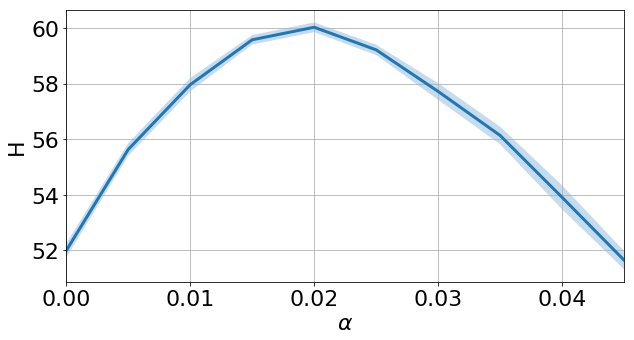

In [203]:
plot_df_ci(df=100*df_cub_alpha, filename="alpha_crossvalidation_cub.pdf")

In [9]:
metric_multiplier_cub = df_cub_alpha.idxmax().mean()
print("CUB, metric multiplier:", metric_multiplier_cub)

CUB, metric multiplier: 0.02


## CUB dataset compute performance on test

In [10]:
results_cub = evaluate_test_result(logdir=log_dir_test, 
                                   filter=filter, metric_multiplier=metric_multiplier_cub)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.


Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loading split trainval
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_trainval_xian2017.pkl
INFO:root:Loaded cache in 7.098782 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.301628 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.183968 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:r

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.56it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.92it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.04it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.38it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 40.63it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.50it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.52it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.55it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 41.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.75it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 40.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.96it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.09it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.40it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.56it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 40.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.93it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.37it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 38.05it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.20it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.99it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.75it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split

In [209]:
dmean(results_cub)

{'train_AP@50/#sentences10': 0.29490666666666671,
 'train_Top-1 Acc/#sentences10': 0.5092861756820336,
 'train_AP@50/#sentences50': 0.34962666666666664,
 'train_Top-1 Acc/#sentences50': 0.73651909310774966,
 'train_AP@50/#sentences100': 0.35605333333333339,
 'train_Top-1 Acc/#sentences100': 0.78375833141782203,
 'train_AP@50/#sentences200': 0.36160000000000003,
 'train_Top-1 Acc/#sentences200': 0.80964436012256658,
 'train_AP@50/#sentences400': 0.36331999999999998,
 'train_Top-1 Acc/#sentences400': 0.82456732464790439,
 'train_AP@50/#sentences1000': 0.36373333333333335,
 'train_Top-1 Acc/#sentences1000': 0.82610336348771263,
 'test_AP@50/#sentences10': 0.33088000000000006,
 'test_Top-1 Acc/#sentences10': 0.44062467056617427,
 'test_AP@50/#sentences50': 0.36384000000000005,
 'test_Top-1 Acc/#sentences50': 0.59221964102580249,
 'test_AP@50/#sentences100': 0.37131999999999993,
 'test_Top-1 Acc/#sentences100': 0.63391310532818923,
 'test_AP@50/#sentences200': 0.37419999999999998,
 'test_To

## Table 3. Generalized zero-shot Top-1 classification accuracy, ablation study.

In [43]:
# Alpha = 0, lambda=0.5, kappa=0.5
results_cub_alpha0_kappa05_lambda05 = evaluate_test_result(logdir=log_dir_test, 
                                                           filter="*mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*", 
                                                           metric_multiplier=0.0)
# Alpha = 0, lambda=0.5, kappa=0
results_cub_alpha0_kappa0_lambda05 = evaluate_test_result(logdir=log_dir_test, 
                                                           filter="*mi_weight=0;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*", 
                                                           metric_multiplier=0.0)
# Alpha = optimized, lambda=0.5, kappa=0
results_cub_alphaOpt_kappa0_lambda05, _, _ = crossval_over_param_range(log_dir_val=log_dir_val, 
                                                     log_dir_test=log_dir_test, 
                                                     filter="*mi_weight=0;*repeat=*txt2img_weight=%g;*dataset=xian2017_cub*", 
                                                     param_range=[0.5])
# Alpha = optimized, lambda=0, kappa=0.5
results_cub_alphaOpt_kappa05_lambda0, _, _ = crossval_over_param_range(log_dir_val=log_dir_val, 
                                                     log_dir_test=log_dir_test, 
                                                     filter="*mi_weight=0.5;*repeat=*txt2img_weight=%g;*dataset=xian2017_cub*", 
                                                     param_range=[0])
# Alpha = optimized, lambda=1, kappa=0.5
results_cub_alphaOpt_kappa05_lambda1, _, _ = crossval_over_param_range(log_dir_val=log_dir_val, 
                                                     log_dir_test=log_dir_test, 
                                                     filter="*mi_weight=0.5;*repeat=*txt2img_weight=%g;*dataset=xian2017_cub*", 
                                                     param_range=[1])

results_cub_alphaOpt_kappa0_lambda05 = results_cub_alphaOpt_kappa0_lambda05[0.5]
results_cub_alphaOpt_kappa05_lambda0 = results_cub_alphaOpt_kappa05_lambda0[0]
results_cub_alphaOpt_kappa05_lambda1 = results_cub_alphaOpt_kappa05_lambda1[1]


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split trainval
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_trainval_xian2017.pkl


Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 12.621667 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.431826 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 5.823018 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_numbe

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.94it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.19it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.82it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.02it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.14it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.84it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 35.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.42it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.40it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 34.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 34.91it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.30it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 34.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 34.25it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.97it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.12it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.45it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.94it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.00it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 34.92it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.59it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZS

INFO:root:Loaded cache in 15.846244 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.788208 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 9.799014 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.96it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.50it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 31.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.35it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 38.45it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.08it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.00it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.04it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.15it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.09it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.29it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.86it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.45it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.53it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.74it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.95it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.59it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=tes

Processing filter: *mi_weight=0;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 8.286244 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.883637 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 7.436759 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.01it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 10.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.05it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.99it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.94it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.48it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.40it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.58it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.61it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.67it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.83it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.25it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.05it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.91it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.93it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.91it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.90it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.57it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.78it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.09it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.73it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.99it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.70it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.97it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.07it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.53it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.31it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 41.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.85it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.31it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.96it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.69it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 40.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.78it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.69it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.54it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 40.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.99it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.52it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.84it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.56it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.78it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=tes

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 5.129341 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.886859 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.908616 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.58it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.93it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.43it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.17it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.50it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 39.24it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.26it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 33.76it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.28it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.72it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.00it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.61it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.42it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.42it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.50it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 39.18it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.78it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.66it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.73it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.81it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.18it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.33it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.45it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.73it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.78it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.02it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.71it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.53it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.83it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.42it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 36.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.08it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.51it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.12it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 36.90it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.30it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZS

INFO:root:Loaded cache in 7.781604 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.469500 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.016084 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 37.30it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.24it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.02it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.55it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 40.67it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.53it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 38.24it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.04it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.35it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.23it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.91it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.05it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.23it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.67it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 40.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.13it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.99it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.60it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.53it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.73it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=tes

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=1;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 5.228292 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.735898 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.065609 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.05it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.08it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.26it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.49it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.85it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.76it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.58it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 34.13it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 33.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.88it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.31it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.20it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.42it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.76it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.14it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.90it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.90it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.22it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.80it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.17it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.01it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.54it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 39.63it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.34it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.73it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.12it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.48it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.91it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 36.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.08it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.55it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.83it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.66it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.37it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.58it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.87it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.26it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.70it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZS

INFO:root:Loaded cache in 6.651143 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.122672 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.873546 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.56it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.24it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.20it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.24it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.01it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.29it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.21it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.48it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.24it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.45it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.53it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.85it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.00it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.12it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 41.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.25it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.46it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.22it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 33.93it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.55it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.83it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=tes

In [52]:
print("alpha=0, lambda=0.5, kappa=0.5") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_cub_alpha0_kappa05_lambda05)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_cub_alpha0_kappa05_lambda05)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_cub_alpha0_kappa05_lambda05)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=0, lambda=0.5, kappa=0") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_cub_alpha0_kappa0_lambda05)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_cub_alpha0_kappa0_lambda05)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_cub_alpha0_kappa0_lambda05)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=optimized, lambda=0.5, kappa=0") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa0_lambda05)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa0_lambda05)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa0_lambda05)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=optimized, lambda=0, kappa=0.5") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa05_lambda0)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa05_lambda0)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa05_lambda0)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=optimized, lambda=1, kappa=0.5") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa05_lambda1)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa05_lambda1)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_cub_alphaOpt_kappa05_lambda1)["test_H_Top-1 Acc/#sentences1000"])


alpha=0, lambda=0.5, kappa=0.5
test_U_Top-1 Acc/#sentences1000: 0.383286113158
test_S_Top-1 Acc/#sentences1000: 0.653493277148
test_H_Top-1 Acc/#sentences1000: 0.48312660249
alpha=0, lambda=0.5, kappa=0
test_U_Top-1 Acc/#sentences1000: 0.392681384446
test_S_Top-1 Acc/#sentences1000: 0.574770076601
test_H_Top-1 Acc/#sentences1000: 0.466575209175
alpha=optimized, lambda=0.5, kappa=0
test_U_Top-1 Acc/#sentences1000: 0.538330261444
test_S_Top-1 Acc/#sentences1000: 0.4956057744
test_H_Top-1 Acc/#sentences1000: 0.51607414786
alpha=0, optimized, lambda=0, kappa=0.5
test_U_Top-1 Acc/#sentences1000: 0.474089260102
test_S_Top-1 Acc/#sentences1000: 0.366140119031
test_H_Top-1 Acc/#sentences1000: 0.413059630913
alpha=optimized, lambda=1, kappa=0.5
test_U_Top-1 Acc/#sentences1000: 0.53904808138
test_S_Top-1 Acc/#sentences1000: 0.5378813812
test_H_Top-1 Acc/#sentences1000: 0.538425730205


## Ablation of $\lambda$, CUB

In [30]:
lambda_vec = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

filter = "*mi_weight=0.5;*repeat=*txt2img_weight=%g;*dataset=xian2017_cub*"

results_cub_lambda, df_crossval_lambda_cub, metric_multiplier_lambda_cub_vec = crossval_over_param_range(
    log_dir_val=log_dir_val, 
    log_dir_test=log_dir_test, 
    filter=filter, 
    param_range=lambda_vec)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_train_xian2017.pkl


Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 5.573127 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.938473 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.212873 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.59it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.14it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.26it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.13it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.08it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.50it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.49it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.50it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.86it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.38it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.36it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.59it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.22it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 41.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.07it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.01it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.82it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.96it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.12it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.64it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.51it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.15it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.40it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.72it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.65it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.30it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 10.60it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.37it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.98it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.02it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.83it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.06it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.68it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.63it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.69it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZS

INFO:root:Loaded cache in 6.710451 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.116081 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.809348 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.86it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.84it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.54it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.05it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.20it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.43it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.30it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.33it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 37.18it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.50it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.75it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.52it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.28it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.10it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=tes

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.1;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.488540 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.805135 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.059395 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.26it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 10.34it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.59it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 12.02it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 10.08it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.90it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.68it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 14.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.29it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.58it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 13.59it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.76it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 12.97it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.65it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 12.94it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.83it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.89it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 13.62it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.56it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.30it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 12.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.40it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;te

100%|██████████| 6/6 [00:00<00:00, 13.10it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 7.568793 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.214212 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.969353 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.86it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.20it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.31it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.77it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.07it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.82it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.44it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 37.55it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.25it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 34.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.68it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 34.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 33.90it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 33.57it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.22it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.09it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 34.82it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.21it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.2;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.612010 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.971554 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.305781 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 30.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.36it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 13.34it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.11it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00,  9.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.72it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 34.69it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 28.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 11.16it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.53it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.96it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 13.34it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 40.12it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.92it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 10.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.79it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.26it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 34.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 12.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 32.28it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.69it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 13.21it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 13.80it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.71it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.15it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00,  7.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.92it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;te

100%|██████████| 6/6 [00:00<00:00, 11.33it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 7.060295 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.177836 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.848873 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.43it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.34it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.18it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.67it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 34.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.11it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.34it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.69it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.43it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.89it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.56it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.07it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.98it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.62it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.80it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.79it/s]
INFO:root:Computing test embeddings, unseen
100%|██████████| 6/6 [00:00<00:00, 12.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xia

INFO:root:Loading existing params.


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.21it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;te

100%|██████████| 6/6 [00:00<00:00, 12.06it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 40.20it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;te

100%|██████████| 6/6 [00:00<00:00, 11.78it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.28it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;te

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=train;d

INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing par

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.99it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;te

100%|██████████| 6/6 [00:00<00:00, 12.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.08it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.05it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;te

100%|██████████| 6/6 [00:00<00:00, 10.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.36it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;te

INFO:root:Loading existing params.


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.08it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.11it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.42it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 34.64it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.71it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 38.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.65it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.20it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.32it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.4;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.310316 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.635776 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.775269 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.76it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;te

100%|██████████| 6/6 [00:00<00:00, 12.42it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.82it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.97it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;te

100%|██████████| 6/6 [00:00<00:00, 12.64it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.09it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;te

147it [00:04, 35.97it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.38it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;d

INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.44it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.18it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.04it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.43it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;te

100%|██████████| 6/6 [00:00<00:00, 13.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.99it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;te

100%|██████████| 6/6 [00:00<00:00, 12.33it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.04it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;te

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.78it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;te

100%|██████████| 6/6 [00:00<00:00, 12.00it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 6.811620 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.986743 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.788905 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.61it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.10it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 38.89it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.82it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.66it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.74it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.78it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.63it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.67it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.94it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.96it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.15it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.12it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.57it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.69it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.921468 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.814916 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.873302 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.80it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.89it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;te

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 10.74it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;d

INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.28it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 13.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.43it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.42it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 13.38it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.23it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.32it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;te

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.14it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.30it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 12.94it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.19it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.20it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 13.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.04it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.87it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;te

100%|██████████| 6/6 [00:00<00:00, 13.35it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 6.699158 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.977164 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.659613 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.88it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.89it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.67it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.22it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.06it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.6;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.156865 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.666005 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.912159 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.14it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 13.99it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.82it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.76it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.79it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 11.62it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.94it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.58it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 12.39it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.78it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 13.31it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.16it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 13.23it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.56it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.35it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 11.61it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.11it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.83it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 11.88it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.85it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.45it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 29.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 12.49it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.56it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 11.81it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;te

100%|██████████| 6/6 [00:00<00:00, 13.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 7.089700 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.293055 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.981490 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.96it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.04it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.30it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.36it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.69it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.30it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.61it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 34.10it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.45it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.58it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.46it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 40.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.00it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.98it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 40.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.55it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.31it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.82it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.03it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.49it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.36it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.7;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.262398 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.784683 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.777715 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.43it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.31it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 13.38it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.32it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 13.10it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.42it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.32it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 12.53it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.84it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 12.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.80it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.52it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 32.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 12.70it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.26it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.54it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 12.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.85it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 13.52it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 13.28it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.19it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 13.53it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.16it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;te

100%|██████████| 6/6 [00:00<00:00, 12.51it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 6.934688 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.062023 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.821889 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.41it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 38.63it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.16it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.09it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.04it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.77it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 40.16it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.22it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.40it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.99it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.83it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.39it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.38it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.22it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.16it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.23it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.26it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.8;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.041344 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.683594 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.828544 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.99it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 13.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.97it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 13.07it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.01it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.25it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.45it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 11.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.14it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.09it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 11.84it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.43it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.00it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 13.55it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.12it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.27it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 13.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.31it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 13.13it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 11.80it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.84it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 11.95it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.25it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 40.40it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;te

100%|██████████| 6/6 [00:00<00:00, 12.75it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 6.998711 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.186739 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.906793 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.24it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.49it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.59it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.55it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.40it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.22it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.51it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.29it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.03it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.62it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.15it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.10it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.80it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.59it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.47it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.88it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.43it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.9;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 5.229979 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.735481 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.816409 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.14it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.95it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.80it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.29it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.44it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.07it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.02it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 35.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.29it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.77it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 13.02it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.02it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 11.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.83it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 13.06it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.67it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.83it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;te

100%|██████████| 6/6 [00:00<00:00, 12.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 7.010067 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.972285 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.880148 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.90it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.54it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.73it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.31it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 33.07it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.82it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.06it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.61it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.24it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.73it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.22it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.26it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.01it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.37it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.97it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.03it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.04it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.06it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=1;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 4.982136 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.604546 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.100485 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.45it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.90it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.96it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.60it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.93it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.74it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.26it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.88it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.98it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.55it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.97it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.07it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.36it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.95it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.18it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.02it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.37it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.44it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.05it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.04it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.57it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.32it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.57it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.39it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.01it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.39it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.88it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.52it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.42it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.34it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZS

INFO:root:Loaded cache in 6.413232 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.192898 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 4.503360 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.32it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 38.81it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.59it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.79it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.77it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.81it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.46it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.08it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.76it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.41it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.39it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.54it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.03it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.98it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.62it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.52it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.23it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=tes

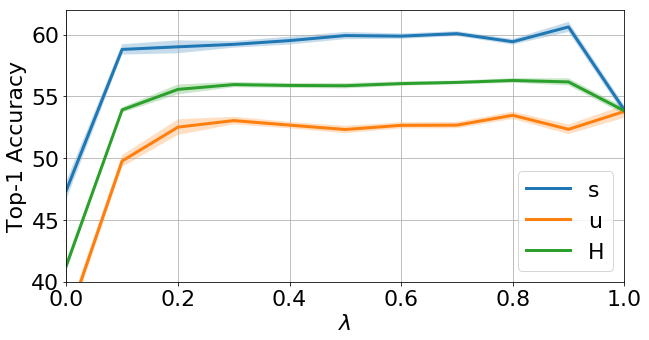

In [205]:
def plot_multiline_with_ci(results, columns, filename, xlabel, ylabel, ylim):
    df = []
    df_conf_low = []
    df_conf_high = []
    for key in results.keys():
        d = dmean(results[key])
        d = {c: d[c] for c in columns}

        d_conf = dci(results[key])
        d_conf = {c: d_conf[c] for c in columns}

        df.append(100*pd.DataFrame(index=d.keys(), data=d.values(), columns=[key]))
        ci = 100*pd.DataFrame(index=d.keys(), data=d_conf.values(), columns=[key, key])
        df_conf_low.append(ci.iloc[:,0])
        df_conf_high.append(ci.iloc[:,1])
        
#         print(ci)

    df_lambda_cub = pd.concat(df, axis=1).transpose()
    df_lambda_cub_low = pd.concat(df_conf_low, axis=1).transpose()
    df_lambda_cub_high = pd.concat(df_conf_high, axis=1).transpose()

    mplt.rcParams.update({'font.size': 22})
    mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(1,1,1)

    for c in df_lambda_cub.columns:
        df_lambda_cub[c].plot(ax=ax, linewidth=3.0)
        ax.fill_between(df_lambda_cub.index, df_lambda_cub_low[c], df_lambda_cub_high[c], alpha=0.25)

    ax.legend([r"s", r"u", r"H"])
    plt.grid('on')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.ylim(ylim)
    plt.show()

    fig.savefig(os.path.join(plots_output_folder, filename), bbox_inches='tight')

plot_multiline_with_ci(results=results_cub_lambda, 
                       columns=['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000'], 
                       filename="lambda_cub.pdf", xlabel=r'$\lambda$', ylabel="Top-1 Accuracy", ylim=[40, 62])




In [164]:
# columns = ['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000']
# df = []
# df_conf_low = []
# df_conf_high = []
# for key in results_cub_lambda.keys():
#     d = dmean(results_cub_lambda[key])
#     d = {c: d[c] for c in columns}
    
#     d_conf = dci(results_cub_lambda[key])
#     d_conf = {c: d_conf[c] for c in columns}
    
#     df.append(pd.DataFrame(index=d.keys(), data=d.values(), columns=[key]))
#     ci = pd.DataFrame(index=d.keys(), data=d_conf.values(), columns=[key, key])
#     df_conf_low.append(ci.iloc[:,0])
#     df_conf_high.append(ci.iloc[:,1])

# df_lambda_cub = pd.concat(df, axis=1).transpose()
# df_lambda_cub_low = pd.concat(df_conf_low, axis=1).transpose()
# df_lambda_cub_high = pd.concat(df_conf_high, axis=1).transpose()

# mplt.rcParams.update({'font.size': 22})
# mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

# fig = plt.figure(figsize=(10,5))
# ax = fig.add_subplot(1,1,1)

# for c in df_lambda_cub.columns:
#     df_lambda_cub[c].plot(ax=ax)
#     ax.fill_between(df_lambda_cub.index, df_lambda_cub_low[c], df_lambda_cub_high[c], alpha=0.25)
    
# ax.legend([r"s", r"u", r"H"])
# plt.grid('on')
# ax.set_xlabel(r'$\lambda$')
# ax.set_ylabel(r'Top-1 Accuracy')
# plt.show()

# fig.savefig(os.path.join(plots_output_folder, "lambda_cub.pdf"), bbox_inches='tight')

## Ablation of $\kappa$, CUB

In [ ]:
kappa_vec = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

filter = "*mi_weight=%g;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*"

results_cub_kappa, df_crossval_kappa_cub, metric_multiplier_kappa_cub_vec = crossval_over_param_range(
    log_dir_val=log_dir_val, 
    log_dir_test=log_dir_test, 
    filter=filter, 
    param_range=kappa_vec)



INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_train_xian2017.pkl


Processing filter: *mi_weight=0;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 4.772463 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.556795 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.957898 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.52it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.81it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.91it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.95it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.34it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.13it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.50it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.77it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.90it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.62it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.73it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.13it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.06it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 36.89it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.10it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.90it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.70it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.40it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.93it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
49it [00:01, 34.26it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

147it [00:03, 37.71it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.52it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.50it/s]
I

INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.50it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.81it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extr

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZS

INFO:root:Loaded cache in 6.596546 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 3.010907 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.664679 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.03it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.37it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.86it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.53it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.57it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.03it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.86it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.06it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.54it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.62it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.09it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.99it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.00it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.48it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.22it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.13it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=tes

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.90it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.45it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=tes

Processing filter: *mi_weight=0.1;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.794052 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.528087 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.604414 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;te

37it [00:00, 37.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.82it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.64it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_inter

INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.30it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.00it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;te

37it [00:00, 39.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.79it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.63it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.30it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.99it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;te

37it [00:00, 38.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.39it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.15it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.18it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;te

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;d

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.31it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.98it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;te

37it [00:00, 38.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.23it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 6.314854 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.814829 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.532499 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.23it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.87it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.03it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.49it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.12it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.10it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.13it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.48it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.99it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.75it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.15it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.20it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.54it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.64it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.82it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 38.03it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.67it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.06it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.24it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.2;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.741195 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.602598 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.483272 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.73it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;te

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 39.01it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_w

37it [00:00, 37.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.57it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.52it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;te

37it [00:00, 37.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.32it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.83it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;te

37it [00:00, 38.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.68it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.56it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.01it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;te

37it [00:00, 38.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.54it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.53it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.64it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.99it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;te

37it [00:00, 37.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.45it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.54it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;te

37it [00:00, 37.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.79it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.13it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.36it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.58it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;te

37it [00:00, 37.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.58it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.36it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;te

37it [00:00, 38.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 11.75it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.96it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 6.293577 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.873471 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.693080 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.98it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.49it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.32it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.26it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.89it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.70it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.44it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 38.51it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.58it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.21it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.36it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.50it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.98it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.33it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.63it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.73it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
147it [00:04, 36.59it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.60it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.82it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.82it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;te

37it [00:00, 37.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.07it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.95it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.39it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;te

37it [00:00, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.03it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.45it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.75it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;te

37it [00:01, 36.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;d

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.40it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.39it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;te

37it [00:00, 37.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.38it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.51it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.07it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;te

37it [00:01, 36.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.35it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.48it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;te

37it [00:00, 37.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.52it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.50it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.09it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.21it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.95it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.49it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 36.83it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.12it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.99it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.4;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.631395 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.395205 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.405183 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.02it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.85it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;te

37it [00:00, 37.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.24it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;te

37it [00:00, 37.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.12it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.43it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.65it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;te

37it [00:00, 38.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.99it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.75it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;te

37it [00:00, 37.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.87it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.78it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.10it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;te

37it [00:00, 39.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.57it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.61it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.64it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;te

37it [00:01, 36.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.33it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.31it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.08it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.64it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.61it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.40it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.97it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.70it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.02it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.37it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 35.94it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.88it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 37.57it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.27it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.03it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.30it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.94it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.635897 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.340361 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.282225 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.52it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.54it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;te

37it [00:00, 38.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;d

INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.00it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.70it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;te

37it [00:00, 39.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.14it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.91it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.84it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.27it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.17it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;te

37it [00:00, 39.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;te

37it [00:00, 39.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.62it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 5.914465 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.754697 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.494471 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 38.40it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.70it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.36it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.90it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.38it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.75it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.11it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.74it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.42it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.44it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.52it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.26it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.85it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.49it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.35it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.59it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.82it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.56it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.7;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.548436 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.470950 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.412333 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.86it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;te

37it [00:00, 39.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.86it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.13it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.80it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.34it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;te

37it [00:00, 39.79it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.78it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.61it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.72it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;te

37it [00:00, 39.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.08it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.68it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;te

37it [00:00, 38.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.17it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.00it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.49it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.60it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;te

37it [00:00, 39.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.28it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.76it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.84it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;te

37it [00:00, 40.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.87it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.78it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.84it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;te

37it [00:00, 39.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.88it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.03it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;te

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.60it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.11it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.65it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.52it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.68it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.74it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.34it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.79it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.98it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.8;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.549185 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.439427 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.347337 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.51it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.41it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;te

37it [00:00, 39.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.80it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.39it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 41.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;te

37it [00:00, 38.07it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.23it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.04it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.97it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;te

93it [00:02, 39.26it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.06it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=4;txt

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.87it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.37it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;te

37it [00:00, 39.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.40it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.88it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.33it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.20it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;te

37it [00:00, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.05it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.84it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.08it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.32it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;te

37it [00:00, 38.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.74it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.38it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.28it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.33it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 37.48it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.82it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.28it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 37.21it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.46it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.45it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.25it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.59it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.17it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.8;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.9;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featu

INFO:root:Loaded cache in 4.601889 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.420858 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.401901 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_o

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.62it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.33it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.43it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;te

37it [00:00, 37.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.58it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.25it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.67it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;te

37it [00:00, 37.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.94it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 13.05it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.41it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.56it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;te

INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 37.11it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.67it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.37it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;te

37it [00:00, 38.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.58it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 12.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.54it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.87it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;te

37it [00:01, 36.83it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.75it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

100%|██████████| 6/6 [00:00<00:00, 11.97it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_ex

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.12it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.53it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;te

37it [00:00, 38.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split

INFO:root:Loaded cache in 5.853338 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_seen_xian2017.pkl
INFO:root:Loaded cache in 2.661671 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_test_unseen_xian2017.pkl
INFO:root:Loaded cache in 3.333505 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:05, 37.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.91it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.34it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.55it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.81it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.87it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.72it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.08it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.44it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.53it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.42it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.93it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 38.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.25it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.80it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.55it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 37.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.27it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 36.88it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 36.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
221it [00:06, 36.17it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 37.43it/s]
INFO:root:Computing test embeddings, seen
56it [00:01, 39.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=1;*repeat=*txt2img_weight=0.5;*dataset=xian2017_cub*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_ext

INFO:root:Loaded cache in 4.626951 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_seen_xian2017.pkl
INFO:root:Loaded cache in 2.472700 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_cub/split_val_unseen_xian2017.pkl
INFO:root:Loaded cache in 5.552992 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.46it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 39.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 12.78it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.24it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.60it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.32it/s]
INFO:root:Computing test embeddings, unseen
93it [00:02, 38.78it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.43it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_s

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 13.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2017_cub;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/pa

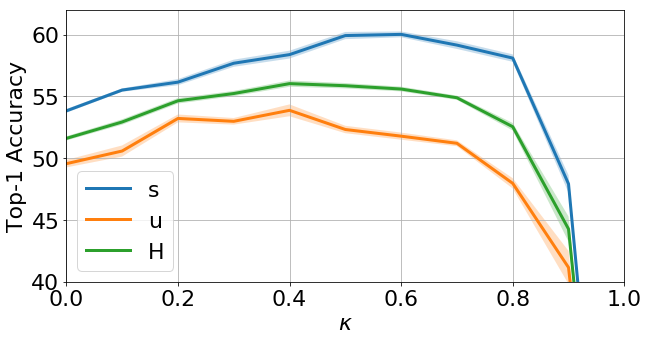

In [206]:
plot_multiline_with_ci(results=results_cub_kappa, 
                       columns=['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000'], 
                       filename="kappa_cub.pdf", xlabel=r'$\kappa$', ylabel="Top-1 Accuracy", ylim=[40,62])



In [194]:
# columns = ['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000']
# df = []
# for key in results_cub_kappa.keys():
#     d = dmean(results_cub_kappa[key])
#     d = {c: d[c] for c in columns}
    
#     df.append(pd.DataFrame(index=d.keys(), data=d.values(), columns=[key]))

# df_kappa_cub = pd.concat(df, axis=1).transpose()

# mplt.rcParams.update({'font.size': 22})
# mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

# fig = plt.figure(figsize=(10,5))
# ax = fig.add_subplot(1,1,1)

# (100*df_kappa_cub).plot(ax=ax)
# ax.legend([r"s", r"u", r"H"])
# plt.grid('on')
# plt.ylim(40, 62)
# ax.set_xlabel(r'$\kappa$')
# ax.set_ylabel(r'Top-1 Accuracy')
# plt.show()

# fig.savefig(os.path.join(plots_output_folder, "kappa_cub.pdf"), bbox_inches='tight')

## FLOWERS

In [14]:
filter = "*mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*" 

df_flowers_alpha = crossvalidate_metric_multiplier(logdir=log_dir_val, filter=filter)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_train_xian2018.pkl


Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split

INFO:root:Loaded cache in 4.491251 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.179416 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.052539 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.46it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.41it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.61it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.88it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.62it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.10it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.21it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.91it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.27it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.56it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.33it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.71it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.17it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.26it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 40.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.89it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.31it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.58it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

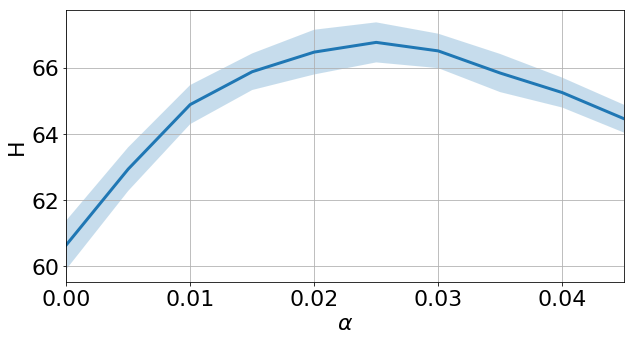

In [204]:
plot_df_ci(df=100*df_flowers_alpha, filename="alpha_crossvalidation_flowers.pdf")

In [16]:
metric_multiplier_flowers = df_flowers_alpha.idxmax().mean()
print("FLOWERS, metric multiplier:", metric_multiplier_flowers)

FLOWERS, metric multiplier: 0.0265


## FLOWERS dataset compute performance on test

In [17]:
results = evaluate_test_result(logdir=log_dir_test, 
                               filter=filter, metric_multiplier=metric_multiplier_flowers)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split trainval
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_trainval_xian2018.pkl


Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 6.162678 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.669679 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.301579 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.28it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 35.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.31it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.25it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.45it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.30it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.92it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.38it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.19it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.53it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.95it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 41.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.19it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.50it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 34.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.58it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 34.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 34.98it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 33.70it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.63it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_s

In [210]:
dmean(results)

{'train_AP@50/#sentences10': 0.66948780487804882,
 'train_Top-1 Acc/#sentences10': 0.71931066803360788,
 'train_AP@50/#sentences50': 0.81414634146341458,
 'train_Top-1 Acc/#sentences50': 0.89113080775739273,
 'train_AP@50/#sentences100': 0.8339512195121952,
 'train_Top-1 Acc/#sentences100': 0.91627224448797906,
 'train_AP@50/#sentences200': 0.84339024390243922,
 'train_Top-1 Acc/#sentences200': 0.92841250547014398,
 'train_AP@50/#sentences400': 0.84756097560975618,
 'train_Top-1 Acc/#sentences400': 0.9332159484608743,
 'train_AP@50/#sentences1000': 0.8485853658536584,
 'train_Top-1 Acc/#sentences1000': 0.9366855235036905,
 'test_AP@50/#sentences10': 0.49740000000000001,
 'test_Top-1 Acc/#sentences10': 0.56540378366568755,
 'test_AP@50/#sentences50': 0.57510000000000006,
 'test_Top-1 Acc/#sentences50': 0.71218467117392081,
 'test_AP@50/#sentences100': 0.5848000000000001,
 'test_Top-1 Acc/#sentences100': 0.74001859806689618,
 'test_AP@50/#sentences200': 0.59320000000000006,
 'test_Top-1 

## Table 3. Generalized zero-shot Top-1 classification accuracy, ablation study.

In [54]:
# Alpha = 0, lambda=0.5, kappa=0.5
results_flowers_alpha0_kappa05_lambda05 = evaluate_test_result(logdir=log_dir_test, 
                                                           filter="*mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*", 
                                                           metric_multiplier=0.0)
# Alpha = 0, lambda=0.5, kappa=0
results_flowers_alpha0_kappa0_lambda05 = evaluate_test_result(logdir=log_dir_test, 
                                                           filter="*mi_weight=0;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*", 
                                                           metric_multiplier=0.0)
# Alpha = optimized, lambda=0.5, kappa=0
results_flowers_alphaOpt_kappa0_lambda05, _, _ = crossval_over_param_range(log_dir_val=log_dir_val, 
                                                     log_dir_test=log_dir_test, 
                                                     filter="*mi_weight=0;*repeat=*txt2img_weight=%g;*dataset=xian2018_flowers*", 
                                                     param_range=[0.5])
# Alpha = optimized, lambda=0, kappa=0.5
results_flowers_alphaOpt_kappa05_lambda0, _, _ = crossval_over_param_range(log_dir_val=log_dir_val, 
                                                     log_dir_test=log_dir_test, 
                                                     filter="*mi_weight=0.5;*repeat=*txt2img_weight=%g;*dataset=xian2018_flowers*", 
                                                     param_range=[0])
# Alpha = optimized, lambda=1, kappa=0.5
results_flowers_alphaOpt_kappa05_lambda1, _, _ = crossval_over_param_range(log_dir_val=log_dir_val, 
                                                     log_dir_test=log_dir_test, 
                                                     filter="*mi_weight=0.5;*repeat=*txt2img_weight=%g;*dataset=xian2018_flowers*", 
                                                     param_range=[1])

results_flowers_alphaOpt_kappa0_lambda05 = results_flowers_alphaOpt_kappa0_lambda05[0.5]
results_flowers_alphaOpt_kappa05_lambda0 = results_flowers_alphaOpt_kappa05_lambda0[0]
results_flowers_alphaOpt_kappa05_lambda1 = results_flowers_alphaOpt_kappa05_lambda1[1]


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split trainval
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_trainval_xian2018.pkl


Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.468933 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.565358 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.346134 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 38.07it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.81it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 34.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.43it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.70it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.03it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.98it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.47it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.56it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.60it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 34.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.24it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.35it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.47it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.24it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 34.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.25it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.58it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.86it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_s

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 6.239504 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.410982 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.213154 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.11it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.38it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.80it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.98it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.02it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.88it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.31it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.90it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.89it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.27it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.65it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.70it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.43it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.81it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.29it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.58it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.17it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.13it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text

INFO:root:Loaded cache in 4.699670 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.298609 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.201201 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extracto

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;te

37it [00:00, 39.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.69it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.97it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;te

37it [00:01, 34.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.99it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.30it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.22it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;te

37it [00:00, 37.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.02it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.52it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 34.74it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;te

37it [00:00, 40.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.56it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.04it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;te

37it [00:00, 40.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.58it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;te

37it [00:00, 38.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.42it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.64it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.11it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;te

37it [00:01, 36.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.22it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.85it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;te

37it [00:00, 39.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;te

37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 22.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.03it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.64it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.49it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;te

37it [00:00, 39.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.71it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.30it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;te

37it [00:00, 38.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.48it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.70it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;te

37it [00:00, 37.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.17it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.63it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.65it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;te

37it [00:00, 37.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.91it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 37.06it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_

INFO:root:Loading existing params.


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.25it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 35.95it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;te

37it [00:00, 41.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.17it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.47it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.57it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;te

37it [00:00, 40.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.87it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.98it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.40it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 36.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;te

37it [00:00, 38.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 6.269097 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.318747 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.124581 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.87it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.63it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.85it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.31it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.68it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.99it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.77it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.79it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.86it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
10it [00:00,  6.51it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

147it [00:03, 39.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.90it/s]

INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 39.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.56it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.48it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.21it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.43it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;te

37it [00:00, 40.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.69it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;te

37it [00:00, 41.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.61it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.34it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.56it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;te

37it [00:00, 41.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.23it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;te

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/para

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 32.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 35.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;te

37it [00:00, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.52it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 41.61it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;te

37it [00:00, 39.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.43it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 41.32it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.42it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;te

37it [00:00, 38.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 22.53it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 5.474452 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.385540 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.270418 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.25it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.18it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 40.19it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.27it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.34it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.28it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.80it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.11it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.71it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.89it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.58it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.27it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
171it [00:04, 39.63it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [55]:
print("alpha=0, lambda=0.5, kappa=0.5") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_flowers_alpha0_kappa05_lambda05)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_flowers_alpha0_kappa05_lambda05)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_flowers_alpha0_kappa05_lambda05)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=0, lambda=0.5, kappa=0") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_flowers_alpha0_kappa0_lambda05)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_flowers_alpha0_kappa0_lambda05)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_flowers_alpha0_kappa0_lambda05)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=optimized, lambda=0.5, kappa=0") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa0_lambda05)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa0_lambda05)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa0_lambda05)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=optimized, lambda=0, kappa=0.5") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa05_lambda0)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa05_lambda0)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa05_lambda0)["test_H_Top-1 Acc/#sentences1000"])


print("alpha=optimized, lambda=1, kappa=0.5") 
print("test_U_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa05_lambda1)["test_U_Top-1 Acc/#sentences1000"])
print("test_S_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa05_lambda1)["test_S_Top-1 Acc/#sentences1000"])
print("test_H_Top-1 Acc/#sentences1000:", dmean(results_flowers_alphaOpt_kappa05_lambda1)["test_H_Top-1 Acc/#sentences1000"])


alpha=0, lambda=0.5, kappa=0.5
test_U_Top-1 Acc/#sentences1000: 0.550877972729
test_S_Top-1 Acc/#sentences1000: 0.846231310573
test_H_Top-1 Acc/#sentences1000: 0.667168987667
alpha=0, lambda=0.5, kappa=0
test_U_Top-1 Acc/#sentences1000: 0.540452531383
test_S_Top-1 Acc/#sentences1000: 0.781219302679
test_H_Top-1 Acc/#sentences1000: 0.63884582018
alpha=optimized, lambda=0.5, kappa=0
test_U_Top-1 Acc/#sentences1000: 0.717779642205
test_S_Top-1 Acc/#sentences1000: 0.672460190323
test_H_Top-1 Acc/#sentences1000: 0.694353366825
alpha=optimized, lambda=0, kappa=0.5
test_U_Top-1 Acc/#sentences1000: 0.514879430011
test_S_Top-1 Acc/#sentences1000: 0.604811881327
test_H_Top-1 Acc/#sentences1000: 0.556091931235
alpha=optimized, lambda=1, kappa=0.5
test_U_Top-1 Acc/#sentences1000: 0.694530716122
test_S_Top-1 Acc/#sentences1000: 0.739286669052
test_H_Top-1 Acc/#sentences1000: 0.716178086092


## Aplation, $\lambda$ FLOWERS

In [32]:
lamba_vec = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

filter = "*mi_weight=0.5;*repeat=*txt2img_weight=%g;*dataset=xian2018_flowers*"

results_flowers_lambda, df_crossval_lambda_flowers, metric_multiplier_lambda_flowers_vec = crossval_over_param_range(
    log_dir_val=log_dir_val, 
    log_dir_test=log_dir_test, 
    filter=filter, 
    param_range=lamba_vec)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_train_xian2018.pkl


Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text

INFO:root:Loaded cache in 4.313975 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.075558 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.041813 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extracto

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.97it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;te

37it [00:00, 39.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.34it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.91it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;te

37it [00:01, 35.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.64it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.74it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.08it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;te

37it [00:00, 39.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.80it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;te

37it [00:00, 37.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.95it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;te

37it [00:00, 37.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.67it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.83it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;te

37it [00:00, 39.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.97it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.25it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;te

37it [00:00, 38.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.19it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.97it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;te

37it [00:00, 38.45it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.29it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 36.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;te

37it [00:00, 37.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.02it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.53it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;te

37it [00:00, 38.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.82it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=val;train_split=train;dataset=xian2018_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 5.132905 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.314768 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.034713 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.02it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.27it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.45it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.23it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.78it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.53it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.36it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.47it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.89it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.46it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.63it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.06it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.62it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.28it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.23it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.67it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.93it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.64it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0;test_split

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.1;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.753055 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.045025 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.119986 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.34it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.13it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.28it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 35.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.74it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.51it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.33it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.10it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.87it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.59it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 22.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.35it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.41it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.30it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.46it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.98it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.96it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.81it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.272807 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.281944 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.105261 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.65it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.14it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.13it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.01it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.79it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.92it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.64it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.08it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.38it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.89it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.25it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.42it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.61it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.50it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.13it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.20it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.05it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.1;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.00it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.1;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.2;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.343795 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.043186 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.077626 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.68it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.25it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.32it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.19it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.21it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.17it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.25it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.41it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.79it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.43it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.24it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.44it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.36it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.79it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.12it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.20it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 36.11it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.58it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.08it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.67it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.18it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.10it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.81it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.48it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.92it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.001471 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.245290 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.209910 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.91it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.49it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.82it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.61it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.81it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.06it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.91it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.92it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.93it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.41it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.41it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.10it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.89it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.42it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.2;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.56it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.81it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.2;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.3;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.412663 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.091869 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.108845 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.23it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.18it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.50it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.33it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.45it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.63it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.02it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.83it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.16it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.75it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.98it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.16it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.34it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.91it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.19it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.40it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.73it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.59it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 34.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.03it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.67it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.16it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.99it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 6.534097 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.503792 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.288432 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.05it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.48it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.43it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.37it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.68it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.13it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.97it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.82it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.63it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.50it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.74it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.22it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.37it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.3;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.67it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.90it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.3;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.4;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.657670 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.226505 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.287558 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.52it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.83it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.21it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.25it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.64it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.52it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.73it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.87it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.17it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.15it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.36it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.17it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.07it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.46it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.18it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.11it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.08it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.23it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.54it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.34it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.44it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.29it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.27it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.303123 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.234126 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.100441 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.53it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.02it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 35.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.42it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.34it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.33it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.44it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.79it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.26it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.69it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.99it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.36it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.65it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.56it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.19it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.08it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.4;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.13it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.60it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.4;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.849365 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.221586 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.170937 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.62it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.41it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.06it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.85it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.72it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.63it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.63it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.95it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.24it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.77it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.92it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.20it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.57it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.28it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.93it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.00it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.42it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.12it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.14it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.43it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.20it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.37it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.355513 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.235642 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.163085 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.67it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.11it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.67it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.67it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.35it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.11it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.16it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.67it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.99it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.00it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.29it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.48it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.58it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.57it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.34it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.10it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.75it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.6;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.826139 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.182717 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.091595 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.93it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.25it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.86it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.02it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.38it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.11it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.56it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.41it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.82it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.07it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.94it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.61it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.77it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.16it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.05it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.58it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.32it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.56it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.59it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.77it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.879313 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.554135 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.388777 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.07it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.54it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 34.92it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.76it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.18it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.94it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.09it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.45it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.82it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 35.91it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.77it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.02it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 34.59it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.59it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.46it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.73it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.6;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.38it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.17it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.6;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.7;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.835334 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.506770 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.383356 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.99it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.97it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.38it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.32it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.06it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.26it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.67it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.61it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.42it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.57it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.11it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.54it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.87it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.25it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.61it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.90it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.97it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 40.49it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.26it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.56it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.492727 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.412891 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.325144 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.61it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.85it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.12it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.18it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.44it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.71it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.78it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.29it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.31it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.65it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.62it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.43it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.77it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.38it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.95it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.41it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.07it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.7;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.40it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.7;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.8;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 5.633030 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.333392 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.216452 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.77it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.29it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.90it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.26it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.37it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.44it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.23it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.88it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.84it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.94it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.39it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.87it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.55it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.97it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.16it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.26it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.38it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.49it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.84it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.55it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.66it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.379126 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.410517 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.388991 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.96it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.66it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.75it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.87it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.78it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.91it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.45it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.43it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.11it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.80it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.87it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.65it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.81it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.99it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.67it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.49it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.04it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.8;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.16it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.8;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.9;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.616025 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.150911 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.241766 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.06it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.31it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.96it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.65it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.83it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.88it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.63it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.03it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.63it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.60it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.34it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.84it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.65it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.99it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.58it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.81it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.99it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.15it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.77it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.61it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.590153 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.403389 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.226764 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.65it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.96it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.84it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.74it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.12it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.87it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.52it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.81it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.14it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.27it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.86it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.48it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.02it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.06it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.77it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.05it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.68it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.91it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.9;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.68it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.17it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.9;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=1;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text

INFO:root:Loaded cache in 4.570782 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.221903 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.145568 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extracto

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.43it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;te

37it [00:00, 40.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.47it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.65it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.80it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;te

37it [00:00, 39.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.71it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.01it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;te

37it [00:00, 37.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.71it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.26it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;te

37it [00:00, 39.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.28it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.98it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.72it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;te

37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.23it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.17it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;te

37it [00:00, 39.02it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 22.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.81it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.74it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;te

37it [00:00, 36.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.70it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.44it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;te

37it [00:00, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.92it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.93it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;te

37it [00:00, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.64it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.80it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.66it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;te

37it [00:00, 38.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.16it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=val;train_split=train;dataset=xian2018_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 5.255540 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.262219 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.202853 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.02it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 40.15it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.34it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.05it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.83it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.52it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.37it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.28it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.66it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.03it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.84it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.87it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.90it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=1;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.08it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=1;test_split

## Ablation of $\lambda$, FLOWERS

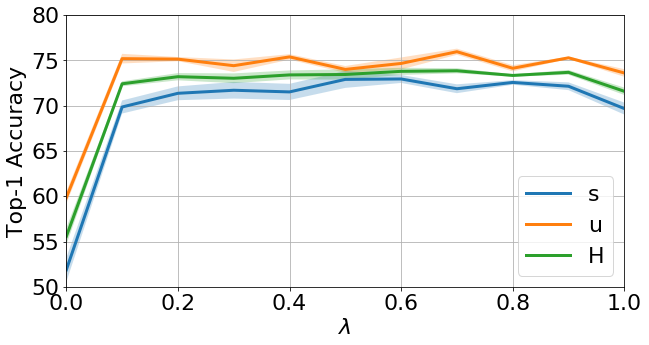

In [207]:

# columns = ['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000']
# df = []
# for key in results_flowers_lambda.keys():
#     d = dmean(results_flowers_lambda[key])
#     d = {c: d[c] for c in columns}
    
#     df.append(pd.DataFrame(index=d.keys(), data=d.values(), columns=[key]))

# df_lambda_flowers = pd.concat(df, axis=1).transpose()

# mplt.rcParams.update({'font.size': 22})
# mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

# fig = plt.figure(figsize=(10,5))
# ax = fig.add_subplot(1,1,1)

# df_lambda_flowers.plot(ax=ax)
# ax.legend([r"s", r"u", r"H"])
# plt.grid('on')
# ax.set_xlabel(r'$\lambda$')
# ax.set_ylabel(r'Top-1 Accuracy')
# plt.show()

# fig.savefig(os.path.join(plots_output_folder, "lambda_flowers.pdf"), bbox_inches='tight')

plot_multiline_with_ci(results=results_flowers_lambda, 
                       columns=['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000'], 
                       filename="lambda_flowers.pdf", xlabel=r'$\lambda$', ylabel="Top-1 Accuracy", ylim=[50,80])


## Ablation of $\kappa$, FLOWERS

In [19]:
kappa_vec = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

filter = "*mi_weight=%g;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*"

results_flowers_kappa, df_crossval_kappa_flowers, metric_multiplier_kappa_flowers_vec = crossval_over_param_range(
    log_dir_val=log_dir_val, 
    log_dir_test=log_dir_test, 
    filter=filter, 
    param_range=kappa_vec)


INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_train_xian2018.pkl


Processing filter: *mi_weight=0;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text

INFO:root:Loaded cache in 4.641238 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.177986 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.169854 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extracto

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 34.44it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;te

37it [00:00, 39.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.91it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.84it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.14it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;te

37it [00:00, 39.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.70it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.82it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.26it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.45it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;te

37it [00:01, 36.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.74it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;te

37it [00:00, 40.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.05it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 40.43it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.59it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.48it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;te

37it [00:00, 37.78it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.20it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.45it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;te

37it [00:00, 39.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.66it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.01it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;te

37it [00:00, 40.07it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.82it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.86it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.81it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;te

37it [00:00, 40.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.48it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.98it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;te

37it [00:00, 39.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.28it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.37it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;te

37it [00:00, 40.62it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.63it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 5.524816 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.323380 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.329587 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.67it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.14it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.36it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.82it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.05it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.53it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.57it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.82it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.29it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.62it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.19it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.88it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.89it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=6;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.80it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.03it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=7;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.20it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.93it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=8;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.22it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.84it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0;repeat=9;txt2img_weight=0.5;test_split

Processing filter: *mi_weight=0.1;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.567782 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.144816 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.126753 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.30it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.32it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.32it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.01it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.07it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 40.83it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.64it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.84it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.99it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.20it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.78it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.04it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.50it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.46it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.35it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.40it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.92it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.18it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.84it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.74it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.44it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.15it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.19it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.42it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.075040 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.296223 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.506131 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.07it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.17it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.91it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.06it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.66it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.78it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.31it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.19it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.65it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.55it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.18it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.40it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.73it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.06it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.67it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.71it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.54it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.93it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.73it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.32it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.1;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.2;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.529093 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.216396 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.135162 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.50it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.95it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.21it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.55it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.74it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.17it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.93it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.94it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.83it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 37.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.45it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.77it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.35it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.09it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 22.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.65it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.47it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.90it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.76it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.99it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.88it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.34it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.072641 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.241961 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.162093 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 41.70it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.38it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.81it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.84it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.81it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.97it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 41.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 44.14it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.11it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 41.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.74it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.83it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.21it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.68it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.25it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 34.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.32it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.93it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 41.82it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.65it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.2;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.3;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.454344 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.313069 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.232850 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.37it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.96it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.20it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.42it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.32it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.16it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.61it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.09it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.07it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.35it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.45it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.23it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.41it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 38.69it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.73it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.51it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.70it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.85it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.48it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.85it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.78it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.74it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.82it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.07it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.27it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.22it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.98it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.45it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 4.957066 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.104496 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 1.896017 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.01it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.90it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.93it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 40.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.67it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.89it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.15it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.53it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.97it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 40.35it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.97it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.06it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.88it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.93it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.92it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.46it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.01it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.67it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 40.43it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.62it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.3;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.4;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 3.917839 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 1.907154 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 1.755385 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 40.10it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.14it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.39it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.13it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.21it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.28it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.14it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.12it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.75it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 41.65it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.57it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.96it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.43it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.50it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.46it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.81it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.77it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.90it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.25it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.26it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.49it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 35.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.68it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 35.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.00it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 39.26it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.75it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.22it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.33it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 6.044751 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.626231 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.378174 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.26it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.04it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.25it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.03it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.18it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.68it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.18it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.97it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.69it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.27it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.20it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.12it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.73it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.59it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.28it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.23it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.47it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.4;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.5;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 5.002852 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.365661 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.306638 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 35.95it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.58it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.86it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.61it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.05it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.05it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.15it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.91it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 40.39it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 35.59it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 15.81it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.64it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.73it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.33it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.51it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.93it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.94it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 38.79it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.29it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.17it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_i

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.95it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.39it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.79it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.397195 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.391926 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.201782 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.91it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.03it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.77it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.18it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.47it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 35.05it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.85it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.46it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.74it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.91it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.83it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.14it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.32it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.13it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.15it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.39it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.57it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.52it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.40it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.52it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 42.99it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.32it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.71it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.06it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.86it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.5;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.6;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 5.246684 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.248921 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.242714 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.31it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.35it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.90it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.12it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.10it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.71it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=4;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.02it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.68it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.33it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.36it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.36it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.03it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.91it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.62it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.79it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.58it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
INFO:root:Computing train embeddings
147it [00:03, 39.59it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.60it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.20it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_featur

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.388927 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.231045 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.106337 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.21it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 37.87it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.45it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.10it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.52it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.27it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.83it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.40it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.18it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.29it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.23it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.90it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.52it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.34it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.49it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 40.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.47it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.56it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.56it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.29it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.46it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 38.22it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.82it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.6;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.7;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.690421 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.140078 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.249673 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.09it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.67it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 22.71it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.57it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.86it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 23.00it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.77it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.72it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.75it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.60it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 40.21it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.10it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.42it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.61it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.97it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.59it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.53it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.83it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.47it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.19it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.20it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.7;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.76it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.19it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=2;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.32it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.38it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=3;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.95it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=4;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.64it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.04it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 36.87it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=5;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:05, 34.55it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.20it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.41it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=6;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 35.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 34.64it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.18it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=7;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.05it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.76it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.15it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=8;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=9;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.12it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.38it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 32.63it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.7;repeat=9;txt2img_weight=0.5;test_s

Processing filter: *mi_weight=0.8;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 5.273418 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.221539 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.178561 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.78it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.63it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.53it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 14.92it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 33.97it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 36.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.67it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:01, 36.43it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 33.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.46it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.27it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=4;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.75it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 16.89it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=5;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 37.82it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.98it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.34it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=6;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 34.54it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.51it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.19it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 36.29it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.01it/s]
INFO:root:Computing test embeddings, seen
37it [00:01, 32.64it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.8;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
INFO:root:Loading split train
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_train_xian2018.pkl


Processing filter: *mi_weight=0.9;*repeat=*txt2img_weight=0.5;*dataset=xian2018_flowers*
Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_datase

INFO:root:Loaded cache in 4.579234 sec
INFO:root:Loading split val_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_seen_xian2018.pkl
INFO:root:Loaded cache in 2.149509 sec
INFO:root:Loading split val_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_val_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.084605 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.24it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.33it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 37.72it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.65it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.16it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.14it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 41.28it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.35it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.68it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.91it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.68it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.30it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.86it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.32it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=3;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.95it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=3;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=6;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading exis

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 39.50it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.12it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.06it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.99it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=7;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:04, 35.96it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.69it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=8;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.71it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=8;txt2img_weight=0.5;test_split=val;train_split=tra

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.89it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.04it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=9;txt2img_weight=0.

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 20.18it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=0.9;repeat=9;txt2img_weight=0.5;test_split=val;train_split=tra

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_tra

INFO:root:Loaded cache in 5.562812 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.244878 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.075181 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extr

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.15it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.06it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 40.10it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=0;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.46it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.54it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 39.50it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=1;txt2img_weight=0.5;test_s

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=0.9;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
63it [00:01, 36.97it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 6/6 [00:00<00:00, 17.09it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/

INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 17.16it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;d

INFO:root:Loading existing params.
INFO:root:Computing classical zero-shot performance metrics, train
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/para

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.62it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.62it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 38.36it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=2;txt2img_weight=0.5;te

37it [00:00, 38.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.04it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.04it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.73it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.33it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=3;txt2img_weight=0.5;te

37it [00:00, 39.70it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.51it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.27it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.23it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.76it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=4;txt2img_weight=0.5;te

37it [00:00, 40.60it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.92it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=5;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.25it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.36it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.21it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=5;txt2img_weight=0.5;te

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 36.94it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.09it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.00it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=7;txt2img_weight=0.5;te

37it [00:00, 39.90it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 21.17it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=7;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 38.63it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.87it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 40.08it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=8;txt2img_weight=0.5;te

37it [00:00, 39.66it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 18.76it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=8;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
147it [00:03, 37.72it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.80it/s]
INFO:root:Computing test embeddings, seen
37it [00:00, 39.24it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=9;txt2img_weight=0.5;te

37it [00:00, 39.31it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
100%|██████████| 6/6 [00:00<00:00, 19.10it/s]
INFO:root:Computing classical zero-shot performance metrics, test
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190512_143808_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_validation_split/mi_weight=1;repeat=9;txt2img_weight=0.5;test_split=val;train_split=train;dataset=xian2018_

Processing models:
['/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE', '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_s

INFO:root:Loaded cache in 5.191144 sec
INFO:root:Loading split test_seen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_seen_xian2018.pkl
INFO:root:Loaded cache in 2.245642 sec
INFO:root:Loading split test_unseen
INFO:root:Loading cached file /mnt/datasets/public/research/cvpr2016_flowers/split_test_unseen_xian2018.pkl
INFO:root:Loaded cache in 2.206283 sec
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/params.json'
INFO:root:Loading existing params.
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extrac

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.93it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.70it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.16it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=0;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 39.03it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.04it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.71it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=1;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.18it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 40.27it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.85it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=2;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.44it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 41.58it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.88it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=3;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.60it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.10it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 37.82it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=4;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=5;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 36.99it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 39.52it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.47it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=5;txt2img_weight=0.5;test_split

INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000


INFO:tensorflow:Restoring parameters from /mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=6;txt2img_weight=0.5;test_split=test;train_split=trainval;dataset=xian2018_flowers;text_feature_extractor=cnn_bi_lstm;number_of_steps=150001;modality_interaction=NONE/train/model-150000
INFO:root:Computing train embeddings
176it [00:04, 37.30it/s]
INFO:root:Computing test embeddings, unseen
37it [00:00, 38.75it/s]
INFO:root:Computing test embeddings, seen
44it [00:01, 38.14it/s]
INFO:root:Computing generalized zero-shot performance metrics
INFO:root:Searching for '/mnt/scratch/boris/experiments_zeroshot_pairwise/190513_022122_txt2img_weight_dataset_text_feature_extractor_number_of_steps_repeat_modality_interaction_mi_weight_test_split_train_split_GZSL_results_test_split/mi_weight=1;repeat=6;txt2img_weight=0.5;test_split

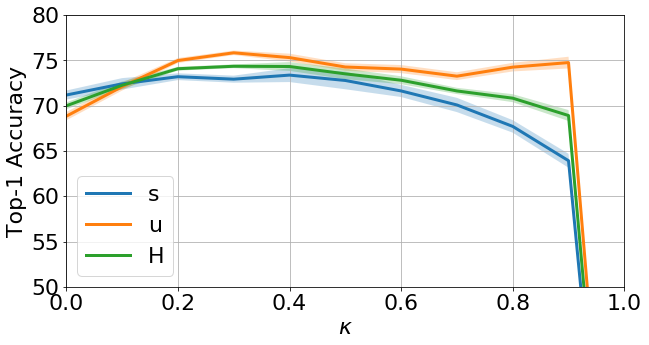

In [208]:
# columns = ['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000']
# df = []
# top1_acc_flowers_kappa = {}
# for key in results_flowers_kappa.keys():
#     d = dmean(results_flowers_kappa[key])
#     d = {c: d[c] for c in columns}
    
#     df.append(pd.DataFrame(index=d.keys(), data=d.values(), columns=[key]))

# df_kappa_flowers = pd.concat(df, axis=1).transpose()

# mplt.rcParams.update({'font.size': 22})
# mplt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

# fig = plt.figure(figsize=(10,5))
# ax = fig.add_subplot(1,1,1)

# (100*df_kappa_flowers).plot(ax=ax)
# ax.legend([r"s", r"u", r"H"])
# plt.grid('on')
# plt.ylim(50, 80)
# ax.set_xlabel(r'$\kappa$')
# ax.set_ylabel(r'Top-1 Accuracy')
# plt.show()

# fig.savefig(os.path.join(plots_output_folder, "kappa_flowers.pdf"), bbox_inches='tight')


plot_multiline_with_ci(results=results_flowers_kappa, 
                       columns=['test_U_Top-1 Acc/#sentences1000', 'test_S_Top-1 Acc/#sentences1000', 'test_H_Top-1 Acc/#sentences1000'], 
                       filename="kappa_flowers.pdf", xlabel=r'$\kappa$', ylabel="Top-1 Accuracy", ylim=[50,80])
